In [51]:
#Historical VaR (95%) — 5th percentile of daily return distribution. CVaR = mean of returns below VaR threshold. Compute for all 40 schemes.
import pandas as pd
df=pd.read_csv("02_nav_history.csv")
df


,amfi_code,date,nav
0,100016,2022-01-03,520.4608
1,100016,2022-01-04,515.0971
2,100016,2022-01-05,521.7239
3,100016,2022-01-06,515.7880
4,100016,2022-01-07,515.1639
5,100016,2022-01-10,510.7136
6,100016,2022-01-11,513.5542
7,100016,2022-01-12,512.3195
8,100016,2022-01-13,510.2445
9,100016,2022-01-14,514.3636


In [52]:
import numpy as np

def var_cvar(series, alpha=0.05):
    var = np.percentile(series, alpha*100)
    cvar = series[series <= var].mean()
    return var, cvar


In [1]:
import pandas as pd

df = pd.read_csv("02_nav_history.csv", parse_dates=["date"])
df = df.sort_values(["amfi_code", "date"])

# Calculate returns
df["returns"] = df.groupby("amfi_code")["nav"].pct_change()

# Function to calculate VaR & CVaR
def var_cvar(returns, confidence=0.95):
    returns = returns.dropna()
    var = returns.quantile(1 - confidence)
    cvar = returns[returns <= var].mean()
    return var, cvar

# Calculate VaR/CVaR for each fund
fund_stats = {}

for fund, group in df.groupby("amfi_code"):
    var, cvar = var_cvar(group["returns"])
    fund_stats[fund] = (var, cvar)

# Add VaR/CVaR columns to every row
df["VaR_95"] = df["amfi_code"].map(lambda x: fund_stats[x][0])
df["CVaR_95"] = df["amfi_code"].map(lambda x: fund_stats[x][1])

display(df)

,amfi_code,date,nav,returns,VaR_95,CVaR_95
0,100016,2022-01-03,520.4608,NaN,-0.014364,-0.018060
1,100016,2022-01-04,515.0971,-0.010306,-0.014364,-0.018060
2,100016,2022-01-05,521.7239,0.012865,-0.014364,-0.018060
3,100016,2022-01-06,515.7880,-0.011377,-0.014364,-0.018060
4,100016,2022-01-07,515.1639,-0.001210,-0.014364,-0.018060
...,...,...,...,...,...,...
45995,149324,2026-05-25,292.4810,0.012106,-0.023483,-0.031036
45996,149324,2026-05-26,291.2707,-0.004138,-0.023483,-0.031036
45997,149324,2026-05-27,288.8007,-0.008480,-0.023483,-0.031036
45998,149324,2026-05-28,280.6873,-0.028093,-0.023483,-0.031036


                VaR_95%       CVaR_95%
nav            34.77491      31.005724
amfi_code  100032.60000  100020.500000


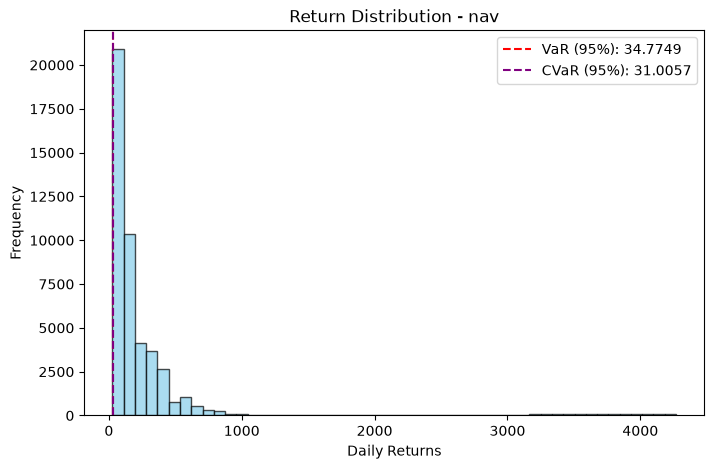

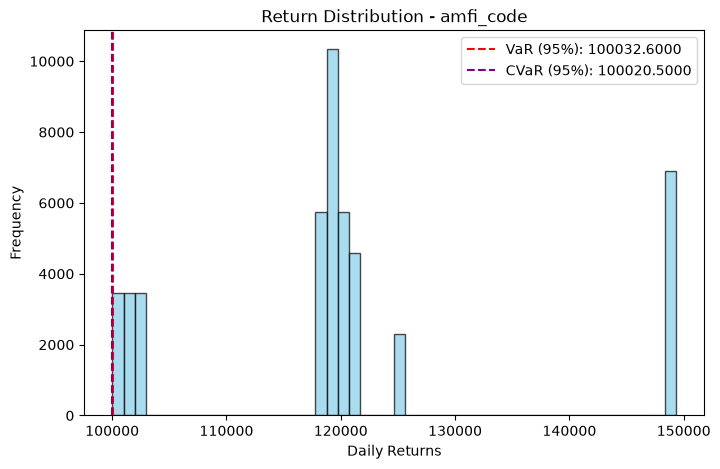

In [4]:
#Historical VaR (95%) — 5th percentile of daily return distribution. CVaR = mean of returns below VaR threshold. Compute for all 40 schemes.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv("02_nav_history.csv", parse_dates=["date"])
df.set_index("date", inplace=True)

# Function to compute VaR and CVaR
def var_cvar(series, alpha=0.05):
    var = np.percentile(series, alpha*100)
    cvar = series[series <= var].mean()
    return var, cvar

# Compute VaR and CVaR for all schemes
results = {}
for scheme in df.columns:
    var, cvar = var_cvar(df[scheme].dropna())
    results[scheme] = {"VaR_95%": var, "CVaR_95%": cvar}

summary = pd.DataFrame(results).T

# Rank schemes by CVaR (most negative = riskiest)
summary_sorted = summary.sort_values("CVaR_95%")
print(summary_sorted)

# Plot top 5 riskiest schemes
top5 = summary_sorted.head(5).index

for scheme in top5:
    series = df[scheme].dropna()
    var, cvar = var_cvar(series)

    plt.figure(figsize=(8,5))
    plt.hist(series, bins=50, color="skyblue", edgecolor="black", alpha=0.7)
    plt.axvline(var, color="red", linestyle="--", label=f"VaR (95%): {var:.4f}")
    plt.axvline(cvar, color="purple", linestyle="--", label=f"CVaR (95%): {cvar:.4f}")
    plt.title(f"Return Distribution - {scheme}")
    plt.xlabel("Daily Returns")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


Index(['amfi_code', 'nav'], dtype='object')


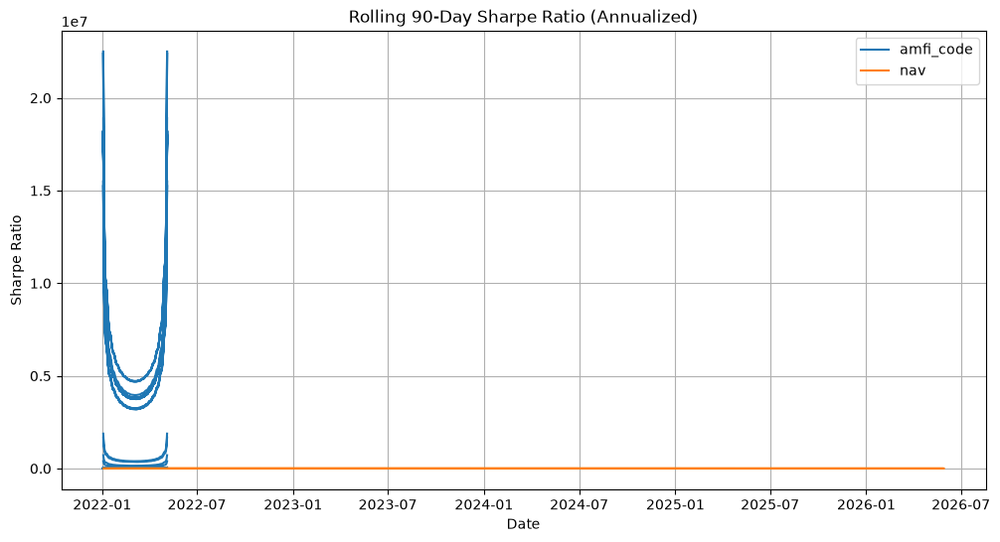

In [24]:
#Rolling 90-day Sharpe — returns.rolling(90).mean() / returns.rolling(90).std() × √252. Plot over time for 5 key funds.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your daily returns dataset
df = pd.read_csv("02_nav_history.csv", parse_dates=["date"])
df.set_index("date", inplace=True)

# Step 1: Inspect column names
print(df.columns)

# Step 2: Pick 5 key funds (replace with actual names from print above)
# Example: if your columns are ['FundA','FundB','FundC','FundD','FundE',...]
key_funds = df.columns[:5]   # automatically take first 5 columns
# Or manually: key_funds = ["FundA", "FundB", "FundC", "FundD", "FundE"]

# Step 3: Calculate rolling 90-day Sharpe ratio
rolling_sharpe = {}
for scheme in key_funds:
    mean_90 = df[scheme].rolling(90).mean()
    std_90 = df[scheme].rolling(90).std()
    sharpe_90 = (mean_90 / std_90) * np.sqrt(252)  # annualized Sharpe
    rolling_sharpe[scheme] = sharpe_90

# Step 4: Combine into DataFrame
sharpe_df = pd.DataFrame(rolling_sharpe)

# Step 5: Plot over time
plt.figure(figsize=(12,6))
for scheme in key_funds:
    plt.plot(sharpe_df.index, sharpe_df[scheme], label=scheme)

plt.title("Rolling 90-Day Sharpe Ratio (Annualized)")
plt.xlabel("Date")
plt.ylabel("Sharpe Ratio")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
08_investor_transactions.csv
07_scheme_performance.csv
06_industry_folio_count.csv
04_monthly_sip_inflows.csv
03_aum_by_fund_house.csv

In [25]:
#Investor cohort analysis — group by first transaction year. Compute avg SIP amount, total invested, and top fund preference per cohort.
import pandas as pd

# Load datasets
tx = pd.read_csv("08_investor_transactions.csv", parse_dates=["transaction_date"])
schemes = pd.read_csv("07_scheme_performance.csv")

# Step 1: Ensure transaction_date is datetime
tx['transaction_date'] = pd.to_datetime(tx['transaction_date'])

# Step 2: Derive cohort (first transaction year per investor)
tx['first_year'] = tx.groupby('investor_id')['transaction_date'].transform('min').dt.year

# Step 3: Average SIP amount per cohort
avg_sip = tx.groupby('first_year')['amount_inr'].mean()

# Step 4: Total invested per cohort
total_invested = tx.groupby('first_year')['amount_inr'].sum()

# Step 5: Top fund preference per cohort
top_fund = tx.groupby(['first_year','amfi_code']).size().reset_index(name='count')
top_fund = top_fund.loc[top_fund.groupby('first_year')['count'].idxmax()]

# Step 6: Merge with scheme names (assuming scheme file has amfi_code + scheme_name)
top_fund = top_fund.merge(schemes[['amfi_code','scheme_name']], on='amfi_code', how='left')

# Step 7: Combine results
summary = pd.DataFrame({
    'avg_sip_amount': avg_sip,
    'total_invested': total_invested
}).reset_index()

summary = summary.merge(top_fund[['first_year','scheme_name']], on='first_year')
summary.rename(columns={'scheme_name':'top_fund'}, inplace=True)

print("\nInvestor Cohort Analysis Summary:")
display(summary)



Investor Cohort Analysis Summary:


,first_year,avg_sip_amount,total_invested,top_fund
0,2024,107422.541832,3491125187,Mirae Asset Emerging Bluechip Fund - Regular -...
1,2025,109158.577061,30455243,SBI Small Cap Fund - Direct Plan - Growth


In [6]:
#SIP continuity analysis — for investors with 6+ SIP transactions, compute avg gap between dates. Flag investors with gap > 35 days as "at-risk".
import pandas as pd

# Load investor transactions
tx = pd.read_csv("08_investor_transactions.csv", parse_dates=["transaction_date"])

# Step 1: Sort by investor and date
tx = tx.sort_values(by=["investor_id","transaction_date"])

# Step 2: Compute gaps between consecutive SIPs (in days)
tx['gap_days'] = tx.groupby('investor_id')['transaction_date'].diff().dt.days

# Step 3: Compute average gap per investor (only for investors with 6+ SIPs)
investor_stats = tx.groupby('investor_id').agg(
    sip_count=('transaction_date','count'),
    avg_gap=('gap_days','mean')
).reset_index()

# Step 4: Filter investors with 6+ SIP transactions
investor_stats = investor_stats[investor_stats['sip_count'] >= 6]

# Step 5: Flag investors with avg gap > 35 days
investor_stats['risk_flag'] = investor_stats['avg_gap'].apply(
    lambda x: "at-risk" if x > 35 else "stable"
)

print("\nSIP Continuity Analysis:")
display(investor_stats.head(20))  # show first 20 rows



SIP Continuity Analysis:


,investor_id,sip_count,avg_gap,risk_flag
1,INV000002,6,82.800000,at-risk
3,INV000004,9,53.375000,at-risk
4,INV000005,8,52.000000,at-risk
5,INV000006,6,99.000000,at-risk
7,INV000008,8,50.285714,at-risk
8,INV000009,7,80.833333,at-risk
9,INV000010,11,32.800000,stable
10,INV000011,11,45.200000,at-risk
11,INV000012,11,41.400000,at-risk
12,INV000013,10,36.888889,at-risk


In [26]:
import pandas as pd
dff=pd.read_csv("07_scheme_performance.csv")
dff

,amfi_code,scheme_name,fund_house,category,plan,return_1yr_pct,return_3yr_pct,return_5yr_pct,benchmark_3yr_pct,alpha,beta,sharpe_ratio,sortino_ratio,std_dev_ann_pct,max_drawdown_pct,aum_crore,expense_ratio_pct,morningstar_rating,risk_grade
0,119551,SBI Bluechip Fund - Regular Plan - Growth,SBI Mutual Fund,Large Cap,Regular,12.42,12.36,14.45,11.49,0.87,0.89,0.88,1.29,14.0,-21.70,14288,1.54,4,Moderate
1,119552,SBI Bluechip Fund - Direct Plan - Growth,SBI Mutual Fund,Large Cap,Direct,15.25,11.30,14.23,9.52,1.78,0.87,0.81,1.29,14.0,-24.43,1231,0.66,3,Moderate
2,119598,SBI Small Cap Fund - Regular Plan - Growth,SBI Mutual Fund,Small Cap,Regular,24.56,23.39,20.67,22.16,1.23,0.89,0.94,1.35,25.0,-13.35,19259,1.43,5,Very High
3,119599,SBI Small Cap Fund - Direct Plan - Growth,SBI Mutual Fund,Small Cap,Direct,20.59,23.14,21.82,22.01,1.13,1.04,0.93,1.67,25.0,-24.78,36061,0.72,4,Very High
4,119120,SBI Magnum Gilt Fund - Regular Plan - Growth,SBI Mutual Fund,Gilt,Regular,5.34,6.07,5.43,4.47,1.60,0.22,1.52,2.11,4.0,-2.30,24101,0.77,5,Low
5,100016,HDFC Top 100 Fund - Regular Plan - Growth,HDFC Mutual Fund,Large Cap,Regular,10.94,14.84,11.32,14.06,0.78,0.97,1.06,1.70,14.0,-17.41,6434,1.55,5,Moderate
6,125497,HDFC Top 100 Fund - Direct Plan - Growth,HDFC Mutual Fund,Large Cap,Direct,11.48,13.38,13.48,12.25,1.13,0.97,0.96,1.45,14.0,-33.50,10611,0.92,4,Moderate
7,100033,HDFC Mid-Cap Opportunities Fund - Regular - Gr...,HDFC Mutual Fund,Mid Cap,Regular,15.43,16.58,17.69,15.63,0.95,0.91,0.87,1.44,19.0,-13.67,23185,1.38,5,High
8,125498,HDFC Mid-Cap Opportunities Fund - Direct - Growth,HDFC Mutual Fund,Mid Cap,Direct,19.98,15.29,15.85,14.39,0.90,1.04,0.80,1.38,19.0,-32.22,18792,0.78,4,High
9,100025,HDFC Short Term Debt Fund - Regular - Growth,HDFC Mutual Fund,Short Duration,Regular,6.83,7.37,6.41,5.39,1.98,0.44,1.84,2.79,4.0,-6.01,27953,0.56,3,Low


In [27]:
#Simple fund recommender — input: risk appetite (Low / Moderate / High). Output: top 3 funds by Sharpe ratio within matching risk_grade. Print recommendation table.
n=input("enter the risk grade(Low/Moderate/High)")#taking the risk appetite
res=dff[dff['risk_grade']==n]
if n not in ["Low","Moderate","High"]:
    print("Invalid risk grade")
else:
    if res.empty:
        print("No matching found")
    else:
        top=res.sort_values(by='sharpe_ratio',ascending=False).head(3)
        display(top[['scheme_name','sharpe_ratio','risk_grade','category']])

   


enter the risk grade(Low/Moderate/High) Moderate


,scheme_name,sharpe_ratio,risk_grade,category
5,HDFC Top 100 Fund - Regular Plan - Growth,1.06,Moderate,Large Cap
34,Mirae Asset Large Cap Fund - Regular - Growth,1.06,Moderate,Large Cap
11,ICICI Pru Bluechip Fund - Direct - Growth,1.03,Moderate,Large Cap


In [29]:
#Sector HHI concentration — Herfindahl-Hirschman Index = Σ(weight_i²) per fund. High HHI = concentrated portfolio. Compare across all equity funds.
d=pd.read_csv("09_portfolio_holdings.csv")
f=pd.read_csv("01_fund_master.csv")
display(d)

,amfi_code,stock_symbol,stock_name,sector,weight_pct,market_value_cr,current_price_inr,portfolio_date
0,119551,POWERGRID,Power Grid Corporation,Utilities,13.85,737.09,6011.08,2025-12-31
1,119551,HDFCBANK,HDFC Bank Ltd,Banking,11.19,88.97,1074.65,2025-12-31
2,119551,GRASIM,Grasim Industries Ltd,Diversified,9.90,208.45,5964.59,2025-12-31
3,119551,DRREDDY,Dr. Reddy's Laboratories,Pharma,4.76,161.32,3748.82,2025-12-31
4,119551,ASIANPAINT,Asian Paints Ltd,Paints,10.25,725.90,1321.45,2025-12-31
...,...,...,...,...,...,...,...,...
317,149324,DIVISLAB,Divi's Laboratories,Pharma,9.54,855.88,7453.05,2025-12-31
318,149324,BHARTIARTL,Bharti Airtel Ltd,Telecom,1.79,969.71,924.41,2025-12-31
319,149324,TCS,Tata Consultancy Services,IT,13.17,1637.69,1927.89,2025-12-31
320,149324,INDUSINDBK,IndusInd Bank Ltd,Banking,7.63,1387.30,3208.86,2025-12-31


In [30]:
rr=d[['stock_name','weight_pct','sector']]
s=pd.concat([rr,f['category']],axis=1)
display(s)

,stock_name,weight_pct,sector,category
0,Power Grid Corporation,13.85,Utilities,Equity
1,HDFC Bank Ltd,11.19,Banking,Equity
2,Grasim Industries Ltd,9.90,Diversified,Equity
3,Dr. Reddy's Laboratories,4.76,Pharma,Equity
4,Asian Paints Ltd,10.25,Paints,Debt
...,...,...,...,...
317,Divi's Laboratories,9.54,Pharma,NaN
318,Bharti Airtel Ltd,1.79,Telecom,NaN
319,Tata Consultancy Services,13.17,IT,NaN
320,IndusInd Bank Ltd,7.63,Banking,NaN


In [31]:
#filtering the category of Equity
f=s[s['category']=='Equity']
f['weight'] = s["weight_pct"] / 100
display(f[['stock_name','weight_pct','sector','category']])

C:\Users\ORCHU TIRUMALA\AppData\Local\Temp\ipykernel_22932\1217352875.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f['weight'] = s["weight_pct"] / 100


,stock_name,weight_pct,sector,category
0,Power Grid Corporation,13.85,Utilities,Equity
1,HDFC Bank Ltd,11.19,Banking,Equity
2,Grasim Industries Ltd,9.90,Diversified,Equity
3,Dr. Reddy's Laboratories,4.76,Pharma,Equity
5,NTPC Ltd,7.48,Utilities,Equity
6,Divi's Laboratories,3.21,Pharma,Equity
7,Bharti Airtel Ltd,13.94,Telecom,Equity
8,HCL Technologies Ltd,18.22,IT,Equity
10,Infosys Ltd,10.55,IT,Equity
11,Power Grid Corporation,5.52,Utilities,Equity


In [32]:
#finding theweight square
f['weight_square']=f['weight_pct']**2
display(f[['stock_name','sector','weight_square','category']])


C:\Users\ORCHU TIRUMALA\AppData\Local\Temp\ipykernel_22932\1915689484.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f['weight_square']=f['weight_pct']**2


,stock_name,sector,weight_square,category
0,Power Grid Corporation,Utilities,191.8225,Equity
1,HDFC Bank Ltd,Banking,125.2161,Equity
2,Grasim Industries Ltd,Diversified,98.0100,Equity
3,Dr. Reddy's Laboratories,Pharma,22.6576,Equity
5,NTPC Ltd,Utilities,55.9504,Equity
6,Divi's Laboratories,Pharma,10.3041,Equity
7,Bharti Airtel Ltd,Telecom,194.3236,Equity
8,HCL Technologies Ltd,IT,331.9684,Equity
10,Infosys Ltd,IT,111.3025,Equity
11,Power Grid Corporation,Utilities,30.4704,Equity


In [34]:
#calculating the HHI for each fund
hhi = f.groupby("stock_name")["weight_square"].sum()

hhi = hhi.reset_index()
hhi.columns = ["Fund Name", "HHI"]
display(hhi)


,Fund Name,HHI
0,Axis Bank Ltd,120.1216
1,Bajaj Finance Ltd,34.3396
2,Bharti Airtel Ltd,194.3236
3,Cipla Ltd,108.9936
4,Divi's Laboratories,64.9162
5,Dr. Reddy's Laboratories,72.2177
6,Grasim Industries Ltd,98.0100
7,HCL Technologies Ltd,331.9684
8,HDFC Bank Ltd,125.2161
9,Hindustan Unilever Ltd,12.4609


In [35]:
#comparing
hhi = hhi.sort_values(
    by="HHI",
    ascending=False
)
display(hhi)

,Fund Name,HHI
18,Reliance Industries Ltd,453.6909
10,ICICI Bank Ltd,448.3097
12,Infosys Ltd,341.1281
7,HCL Technologies Ltd,331.9684
11,IndusInd Bank Ltd,240.8704
17,Power Grid Corporation,222.2929
15,Maruti Suzuki India Ltd,213.1600
2,Bharti Airtel Ltd,194.3236
23,Wipro Ltd,186.5956
8,HDFC Bank Ltd,125.2161


In [36]:
# Function to classify HHI
def classify_hhi(hhi):
    if hhi > 0.30:
        return "Highly Concentrated"
    elif hhi >= 0.15:
        return "Moderately Concentrated"
    else:
        return "Well Diversified"

# Add Interpretation column
hhi["Interpretation"] = hhi["HHI"].apply(classify_hhi)

In [83]:
# Sort by HHI (highest first)
hhi = hhi.sort_values(by="HHI", ascending=False)

# Reset index
hhi = hhi.reset_index(drop=True)

# Add Rank column
hhi.insert(0, "order", range(1, len(hhi) + 1))

# Display the final table
print("\nSector Concentration Comparison (Equity Funds)")
display(hhi)


Sector Concentration Comparison (Equity Funds)


,order,rank,Rank,Fund Name,HHI,Interpretation
0,1,1,1,Reliance Industries Ltd,0.045369,Well Diversified
1,2,2,2,ICICI Bank Ltd,0.044831,Well Diversified
2,3,3,3,Infosys Ltd,0.034113,Well Diversified
3,4,4,4,HCL Technologies Ltd,0.033197,Well Diversified
4,5,5,5,IndusInd Bank Ltd,0.024087,Well Diversified
5,6,6,6,Power Grid Corporation,0.022229,Well Diversified
6,7,7,7,Maruti Suzuki India Ltd,0.021316,Well Diversified
7,8,8,8,Bharti Airtel Ltd,0.019432,Well Diversified
8,9,9,9,Wipro Ltd,0.018660,Well Diversified
9,10,10,10,HDFC Bank Ltd,0.012522,Well Diversified
